In [14]:
import os
import cv2
import copy
import itertools
import numpy as np

print("OpenCV " + cv2.__version__)

OpenCV 4.6.0


In [15]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [40, 10] # figure size in inches

def draw_images(imgs):
    if len(imgs) > 1:
        fig, axs = plt.subplots(1, len(imgs))
        for idx, img in enumerate(imgs):
            axs[idx].axis("off")
            axs[idx].imshow(img)
    else:
        fig, ax = plt.subplots()
        ax.axis("off")
        ax.imshow(imgs[0])
    plt.show()

In [16]:
filenames = ["images/pkmn.png", "images/bus.png"]

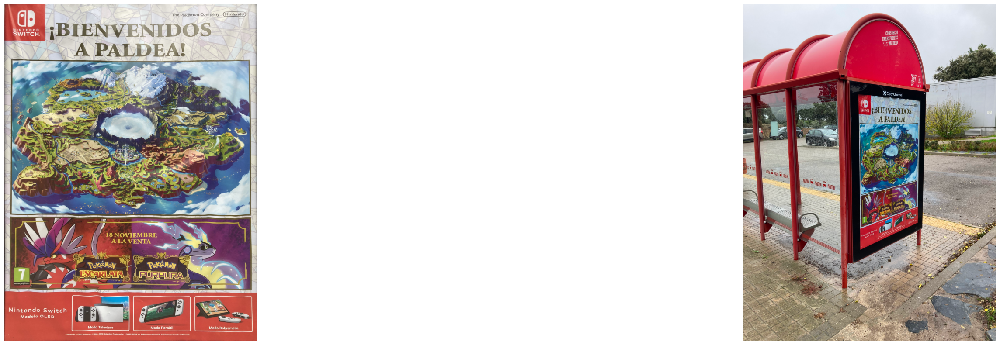

In [17]:
#Draw images in RGB
imgs = [cv2.cvtColor(cv2.imread(filenames[0]), cv2.COLOR_BGR2RGB), cv2.cvtColor(cv2.imread(filenames[1]), cv2.COLOR_BGR2RGB)]
draw_images(imgs)

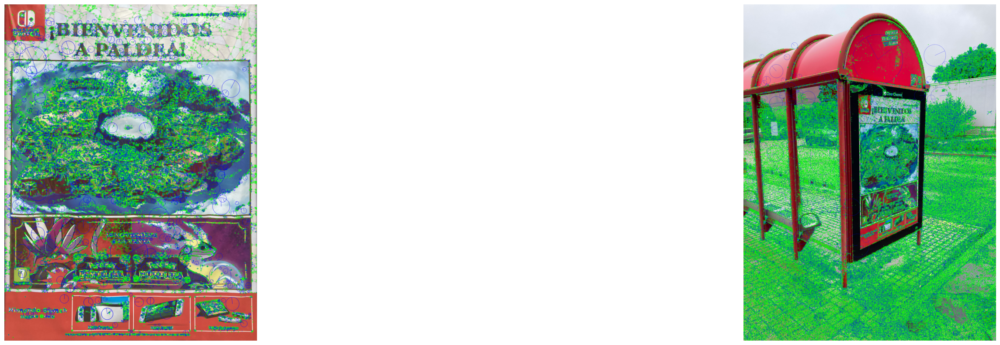

In [18]:
import time

_imgs = copy.deepcopy(imgs)

#FAST detector for corners
fast = cv2.FastFeatureDetector_create()
#SIFT detector for spots and for calculating the descriptors
sift = cv2.xfeatures2d.SIFT_create()
#ORB for calculating the descriptors
orb = cv2.ORB_create()

detectors_time = [] #list to which I'm going to store the computational times for each detector
descriptors_time = [] #list to which I'm going to store the computational time for each descriptor calculation

for idx in range(len(_imgs)):
    start_time1 = time.time() 
    keypoints1 = fast.detect(_imgs[idx], None) #find keypoints with fast detector
    end_time1 = time.time()
    detectors_time.append(end_time1 - start_time1) #corner detection time with fast detector - stored in positions 0 and 2 of the list (1 position for each image)
    cv2.drawKeypoints(_imgs[idx], keypoints1, _imgs[idx], (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT) #draw the points with green color
    
    start_time2 = time.time() 
    keypoints2 = sift.detect(imgs[idx], None) #find keypoints with sift detector
    end_time2 = time.time() 
    detectors_time.append(end_time2 - start_time2) #spot detection time with sift detector - stored in positions 1 and 3 of the list (1 position for each image)
    cv2.drawKeypoints(_imgs[idx], keypoints2, _imgs[idx], color=(0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) #draw keypoints with blue color
draw_images(_imgs) #draw the images with their keypoints

#convert the images from RGB to GRAY
img1_gray = cv2.cvtColor(imgs[0], cv2.COLOR_RGB2GRAY)
img2_gray = cv2.cvtColor(imgs[1], cv2.COLOR_RGB2GRAY)

# find the keypoints and descriptors with SIFT
start_time = time.time() 
kp1, des1 = sift.detectAndCompute(img1_gray,None)
kp2, des2 = sift.detectAndCompute(img2_gray,None)
end_time = time.time()
descriptors_time.append(end_time - start_time) #descriptor calculation time for both images with SIFT - stored in position 0 of the list

# find the keypoints and descriptors with ORB
start_time = time.time() 
kp3 = orb.detect(img1_gray,None)
kp3, des3 = orb.compute(img1_gray, kp3)
kp4 = orb.detect(img2_gray,None)
kp4, des4 = orb.compute(img2_gray, kp4)
end_time = time.time()
descriptors_time.append(end_time - start_time) #descriptor calculation time for both images with ORB - stored in position 1 of the listiptor calculation time for both images with ORB - stored in position 1 of the list

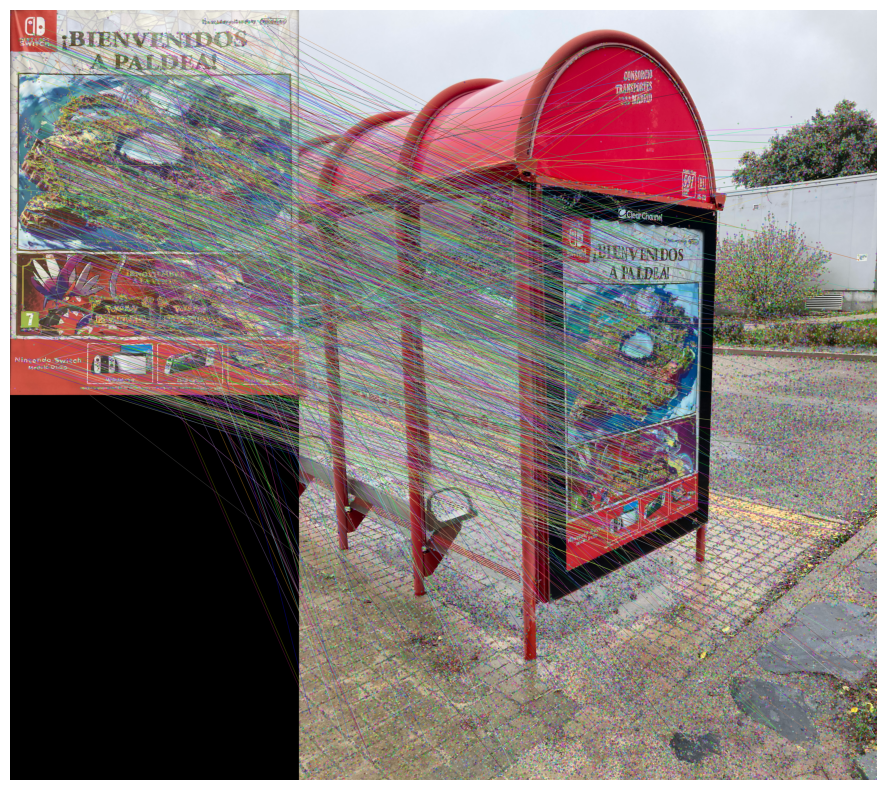

In [19]:
matching_time = [] #list to which I'm going to store the computational time for different matching strategies

#find matches with BFMatcher (usinig the SIFT descriptors)
bf = cv2.BFMatcher()
start_time = time.time()
matches = bf.knnMatch(des1, des2, k=2)
end_time = time.time()
matching_time.append(end_time - start_time) #time needed to find the matches with BFMatcher - stored in position 0 of the list

#find matches with Flann Matcher (using the SIFT descriptors)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
start_time = time.time()
matches = flann.knnMatch(des1,des2,k=2)
end_time = time.time()
matching_time.append(end_time - start_time) #time needed to find the matches with Flann Matcher - stored in position 1 of the list

# store all the good matches (found by Flann Matcher)
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append(m)  

#draw the matches found
img = cv2.drawMatches(imgs[0], kp1, imgs[1], kp2, good, None, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
draw_images([img])

[[[1370 1106]]

 [[1396 2935]]

 [[2081 2618]]

 [[2113 1170]]]


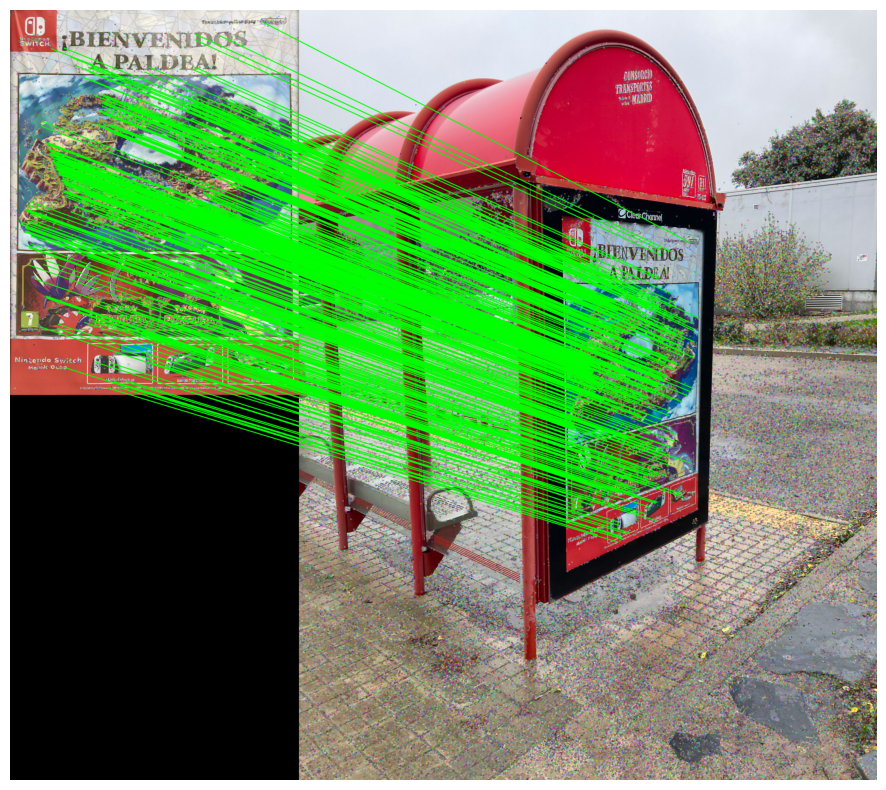

In [20]:
#if more than 10 matches were found
if len(good)>10:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2) #source points belong to imgs[0]
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2) #destination points belongs to imgs[1]
    #find the homography matrix to transform imgs[0] into its correspondence in imgs[1]
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0) 
    h,w = img1_gray.shape #shape of imgs[1]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = np.int32(cv2.perspectiveTransform(pts,M)) #get the corners of the transformation of imgs[0] using the homography matrix
    
    print(dst) #print the corners
else:
    print( "Not enough matches are found - {}/{}".format(len(good), 10) )
    matchesMask = None

#draw the correct matches
draw_params = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask=mask.ravel().tolist(), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img = cv2.drawMatches(imgs[0], kp1, imgs[1], kp2, good, None, matchesThickness=3, **draw_params)
draw_images([img])

(1490, 1070, 3) (4032, 3024, 3)


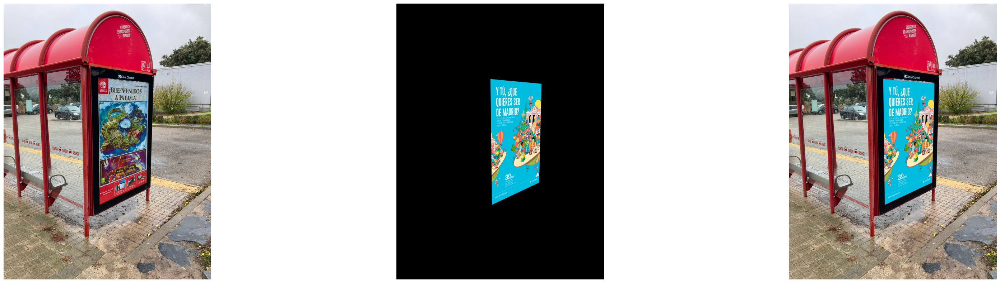

In [21]:
proj_img = cv2.imread('images/ayto.png') #read the projection image
proj_img = cv2.cvtColor(proj_img, cv2.COLOR_BGR2RGB) #projection image in RGB

print(proj_img.shape, imgs[1].shape) #print the sizes of the projection image and imgs[1]
rows,cols,ch = imgs[1].shape

#corners of proj_img 
pts1 = np.float32([[0,0], [0, 1489], [1069, 1489], [1069, 0]]) 
#corners found by cv2.perspectiveTransform() - correspondence of projection image in imgs[1]
pts2 = np.float32([[1370, 1103], [1392, 2940], [2079, 2616], [2114,1172]]) 

#find the matrix that transfroms the projection image to the the wanted one, according to the points given
m = cv2.getPerspectiveTransform(pts1,pts2)  
#transform proj_img
proj_img = cv2.warpPerspective(proj_img,m,(cols,rows)) 

black = np.zeros([1490, 1070, 3], np.uint8) #create a black image with the size of imgs[0]
black.fill(255) #make the image white

#transform the white image in the same way imgs[0] was transformed (using the same matrix m)
white_proj = cv2.warpPerspective(black,m,(cols,rows)) 
#plt.imshow(white_proj)
#plt.show()

#invert the colors (make white black and opposite)
mask = cv2.bitwise_not(white_proj) 
#plt.imshow(mask)
#plt.show()

#replace the white area with imgs[1]
masked_image = cv2.bitwise_and(imgs[1], mask) 
#plt.imshow(masked_image)
#plt.show()

#add proj_img to masked_image
overlay = cv2.add(proj_img, masked_image) 

#draw imgs[1], projection image(transformed) and the result (overlay)
draw_images([imgs[1], proj_img, overlay])

In [22]:
#---Keypoint detection time---
print("Image 1 keypoint detection with FAST:", detectors_time[0])
print("Image 1 keypoint detection with SIFT:", detectors_time[1])
print("Image 2 keypoint detection with FAST:", detectors_time[2])
print("Image 2 keypoint detection with SIFT:", detectors_time[3])
print("\n")

#---Descriptor calculation time---
print("Descriptor calculation time for both images with SIFT:", descriptors_time[0])
print("Descriptor calculation time for both images with ORB:", descriptors_time[1]) 
print("\n")

#---Matching time---
print("Matching time with BFMatcher:", matching_time[0])
print("Matching time with Flann Matcher:", matching_time[1])

Image 1 keypoint detection with FAST: 0.012145519256591797
Image 1 keypoint detection with SIFT: 0.43274760246276855
Image 2 keypoint detection with FAST: 0.08442854881286621
Image 2 keypoint detection with SIFT: 1.6828246116638184


Descriptor calculation time for both images with SIFT: 3.159367322921753
Descriptor calculation time for both images with ORB: 0.2751896381378174


Matching time with BFMatcher: 27.734252452850342
Matching time with Flann Matcher: 2.397256851196289
